# 9章 音声の生成

## 事前準備

In [1]:
!curl -L -o genaibook.zip https://github.com/oreilly-japan/hands-on-generative-ai-ja/releases/download/genaibook/genaibook.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  4678  100  4678    0     0   6585      0 --:--:-- --:--:-- --:--:--  6585


In [2]:
!unzip genaibook.zip

Archive:  genaibook.zip
Made with MacWinZipper (http://tidajapan.com/macwinzipper)
  inflating: genaibook/__init__.py   
  inflating: genaibook/core.py       


In [3]:
!pip install datasets==3.6.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.5/491.5 kB 54.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 29.6 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
  Attempting uninstall: datasets
    Found existing installation: datasets 2.14.4
    Uninstalling datasets-2.14.4:
      Successfully uninstalled datasets-2.14.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.2 requires fsspec==2025.3.2, but you have fsspec 2025.3.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; pl

In [4]:
!pip install evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 10.3 MB/s eta 0:00:00


In [5]:
!pip install jiwer==3.1.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 95.8 MB/s eta 0:00:00


In [6]:
from huggingface_hub import login
login()

In [7]:
from genaibook.core import get_device

In [8]:
import diffusers
import transformers

transformers.logging.set_verbosity_error()
diffusers.logging.set_verbosity_error()

## 音声データ


In [9]:
from datasets import load_dataset_builder

ds_builder = load_dataset_builder(
    "openslr/librispeech_asr"
)
ds_builder.info.splits

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/64 [00:00<?, ?it/s]

{'train.clean.100': SplitInfo(name='train.clean.100', num_bytes=6627791685, num_examples=28539, shard_lengths=None, dataset_name=None),
 'train.clean.360': SplitInfo(name='train.clean.360', num_bytes=23927767570, num_examples=104014, shard_lengths=None, dataset_name=None),
 'train.other.500': SplitInfo(name='train.other.500', num_bytes=31852502880, num_examples=148688, shard_lengths=None, dataset_name=None),
 'validation.clean': SplitInfo(name='validation.clean', num_bytes=359505691, num_examples=2703, shard_lengths=None, dataset_name=None),
 'validation.other': SplitInfo(name='validation.other', num_bytes=337213112, num_examples=2864, shard_lengths=None, dataset_name=None),
 'test.clean': SplitInfo(name='test.clean', num_bytes=368449831, num_examples=2620, shard_lengths=None, dataset_name=None),
 'test.other': SplitInfo(name='test.other', num_bytes=353231518, num_examples=2939, shard_lengths=None, dataset_name=None)}

In [10]:
ds_builder.info.features

{'file': Value(dtype='string', id=None),
 'audio': Audio(sampling_rate=16000, mono=True, decode=True, id=None),
 'text': Value(dtype='string', id=None),
 'speaker_id': Value(dtype='int64', id=None),
 'chapter_id': Value(dtype='int64', id=None),
 'id': Value(dtype='string', id=None)}

In [11]:
from datasets import load_dataset

ds = load_dataset(
    "openslr/librispeech_asr",
    split="train.clean.360",
    streaming=True,
)
sample = next(iter(ds))
sample

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/64 [00:00<?, ?it/s]

{'file': '/home/albert/.cache/huggingface/datasets/downloads/extracted/41321bb258f165f6163b1b0335f41c1ae65f86988d636209307b7ed94af929a4/1487-133273-0000.flac',
 'audio': {'path': '1487-133273-0000.flac',
  'array': array([ 9.15527344e-05,  4.57763672e-04,  5.18798828e-04, ...,
         -4.57763672e-04, -5.49316406e-04, -4.88281250e-04]),
  'sampling_rate': 16000},
 'text': 'THE SECOND IN IMPORTANCE IS AS FOLLOWS SOVEREIGNTY MAY BE DEFINED TO BE THE RIGHT OF MAKING LAWS IN FRANCE THE KING REALLY EXERCISES A PORTION OF THE SOVEREIGN POWER SINCE THE LAWS HAVE NO WEIGHT',
 'speaker_id': 1487,
 'chapter_id': 133273,
 'id': '1487-133273-0000'}

In [12]:
array = sample["audio"]["array"]
sampling_rate = sample["audio"]["sampling_rate"]

# 最初の5秒を得る
array = array[: sampling_rate * 5]
print(f"Number of samples: {len(array)}. Values: {array}")

Number of samples: 80000. Values: [9.15527344e-05 4.57763672e-04 5.18798828e-04 ... 7.05261230e-02
 5.92041016e-02 6.50329590e-02]


ノートブックでは `IPython` を使って音声を再生できる。

In [ ]:
import IPython.display as ipd

ipd.Audio(data=array, rate=sampling_rate)

### 波形

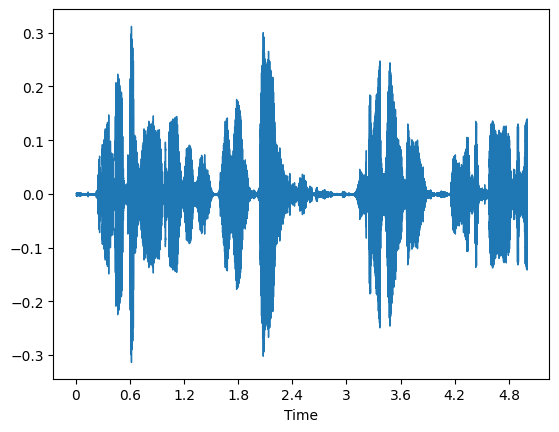

In [ ]:
import librosa.display

librosa.display.waveshow(array, sr=sampling_rate);

### スペクトログラムとメルスペクトログラム

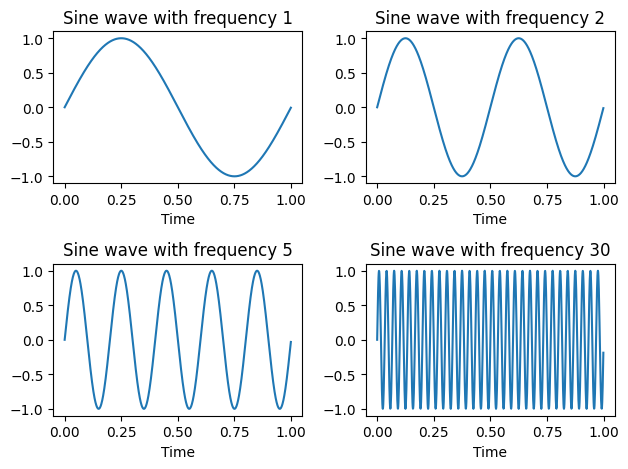

In [ ]:
import numpy as np
from matplotlib import pyplot as plt


def plot_sine(freq):
    sr = 1000  # 1秒あたりのサンプル数
    ts = 1.0 / sr  # サンプリング間隔
    t = np.arange(0, 1, ts)  # 時間ベクトル
    amplitude = np.sin(2 * np.pi * freq * t)

    plt.plot(t, amplitude)
    plt.title("Sine wave with frequency {}".format(freq))
    plt.xlabel("Time")


fig = plt.figure()

plt.subplot(2, 2, 1)
plot_sine(1)

plt.subplot(2, 2, 2)
plot_sine(2)

plt.subplot(2, 2, 3)
plot_sine(5)

plt.subplot(2, 2, 4)
plot_sine(30)

fig.tight_layout()
plt.show()

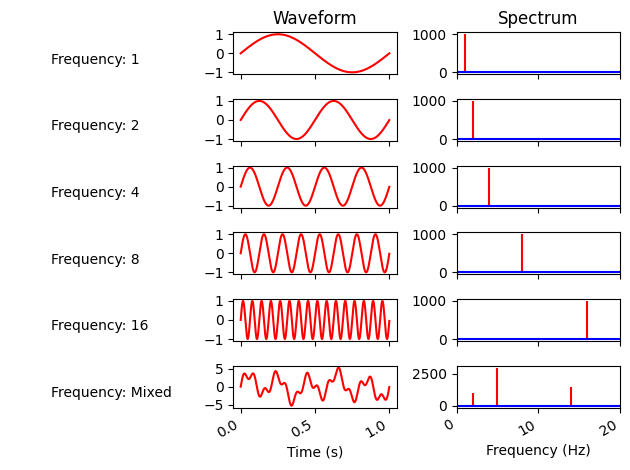

In [ ]:
import numpy as np

fig, axes = plt.subplots(nrows=6, ncols=3)
freqs = [1, 2, 4, 8, 16, 32]
sampling_rate_f = 2000
sampling_interval = 1 / sampling_rate_f

for i in range(6):
    freq = freqs[i]
    text_freq = freq
    samples = np.arange(0, 1, sampling_interval)

    # 関数を作成
    if i == 5:
        data = np.sin(2 * np.pi * 2 * samples)
        data += 3 * np.sin(2 * np.pi * 5 * samples)
        data += 1.5 * np.sin(2 * np.pi * 14 * samples)
        text_freq = "Mixed"
    else:
        data = np.sin(2 * np.pi * freq * samples)

    ax_text = axes[freqs.index(freq), 0]
    ax_waveform = axes[freqs.index(freq), 1]
    ax_spectrum = axes[freqs.index(freq), 2]

    # テキスト列を追加
    ax_text.set_axis_off()
    ax_text.text(0.25, 0.25, f"""Frequency: {text_freq}""")

    # 波形をプロット
    ax_waveform.plot(samples, data, "r")

    # スペクトルをプロット
    ax_spectrum.set_xlim((0, 20))
    X = np.fft.fft(data)
    N = len(X)
    n = np.arange(N)
    T = N / sampling_rate_f
    freq = n / T
    ax_spectrum.stem(freq, np.abs(X), "r", markerfmt=" ", basefmt="-b")

axes[5, 1].set_xlabel("Time (s)")
axes[5, 2].set_xlabel("Frequency (Hz)")
for ax, col in zip(axes[0], ["", "Waveform", "Spectrum"]):
    ax.set_title(col)

fig.autofmt_xdate()
fig.tight_layout()
plt.show()

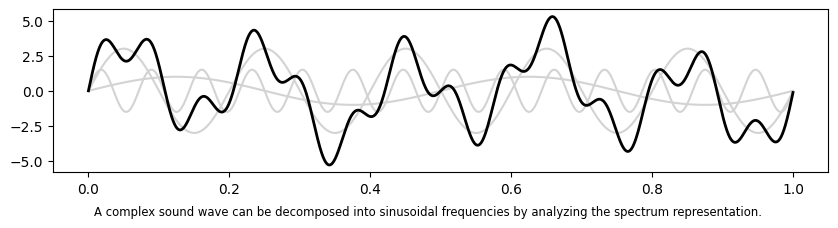

In [ ]:
wave_1 = np.sin(2 * np.pi * 2 * samples)
wave_2 = 3 * np.sin(2 * np.pi * 5 * samples)
wave_3 = 1.5 * np.sin(2 * np.pi * 14 * samples)
combined = wave_1 + wave_2 + wave_3

fig = plt.figure(figsize=(10, 2.4))
fig.autofmt_xdate()
fig.tight_layout()

fig.supxlabel(
    "A complex sound wave can be decomposed into sinusoidal frequencies by analyzing the spectrum representation.",
    fontsize="small",
)

plt.plot(samples, wave_1, label="Wave 1", c="lightgray")
plt.plot(samples, wave_2, label="Wave 2", c="lightgray")
plt.plot(samples, wave_3, label="Wave 3", c="lightgray")
plt.plot(samples, combined, label="Combined", c="black", linewidth=2)

# plt.xticks([])
# plt.yticks([])

plt.show()

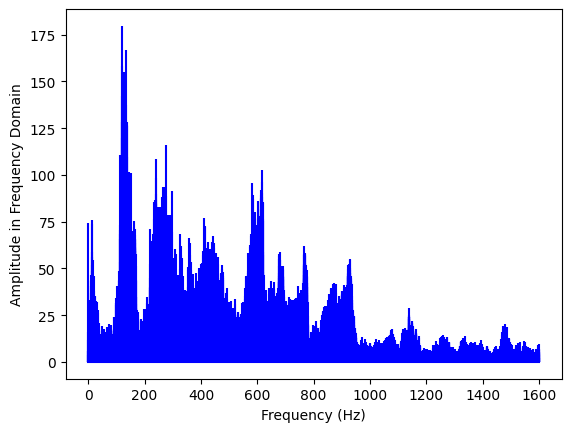

In [ ]:
# 入力信号の高速フーリエ変換（FFT）を計算
X = np.fft.fft(array)

# FFTの結果の長さ（これは入力信号の長さと同じ）
N = len(X)

# FFTの結果に対応する周波数ビンを計算
n = np.arange(N)
T = N / sampling_rate
freq = n / T

# 最初の8000個の周波数ビンについて振幅スペクトルをプロット
# すべてのビンをプロットすることもできるが、反転された形になる
plt.stem(freq[:8000], np.abs(X[:8000]), "b", markerfmt=" ", basefmt="-b")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude in Frequency Domain")
plt.show()

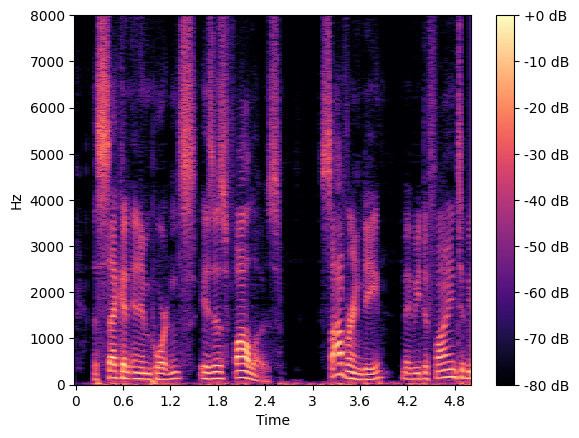

In [ ]:
# 短時間フーリエ変換（STFT）を計算。
# STFTの絶対値を取ることで各周波数ビンの振幅を取得する。
D = np.abs(librosa.stft(array))

# 振幅をデシベルに変換する。
# デシベルは対数スケールである。
S_db = librosa.amplitude_to_db(D, ref=np.max)

# スペクトログラムを表示する。
librosa.display.specshow(S_db, sr=sampling_rate, x_axis="time", y_axis="hz")
plt.colorbar(format="%+2.0f dB");

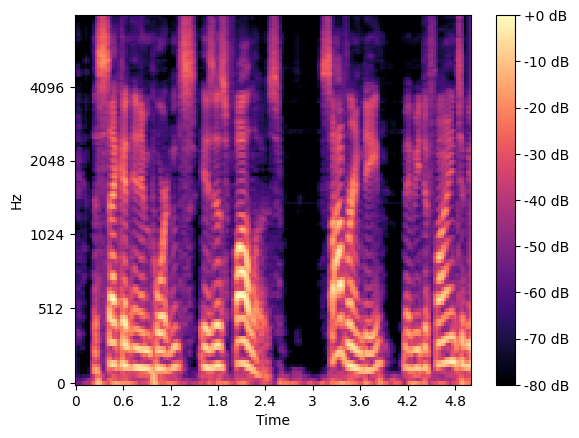

In [ ]:
# 音声信号からメルスペクトログラムを生成する。
# 結果は、各要素が特定の時刻における周波数帯（メルスケール）の強さを表す
# 行列となる。
S = librosa.feature.melspectrogram(y=array, sr=sampling_rate)

# スペクトログラムをデシベルスケールに変換する。
S_dB = librosa.power_to_db(S, ref=np.max)

# メルスペクトログラムを表示する。
librosa.display.specshow(S_dB, sr=sampling_rate, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB");

## Transformerベースのアーキテクチャーによる音声テキスト変換

In [13]:
from transformers import pipeline

pipe = pipeline(
    "automatic-speech-recognition",
    model="openai/whisper-tiny",
    max_new_tokens=100,
)
pipe(array)

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/151M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

preprocessor_config.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/whisper/generation_whisper.py:604: FutureWarning: The input name `inputs` is deprecated. Please make sure to use `input_features` instead.
  warnings.warn(


{'text': ' The second and important is as follows. Sovereignty may be defined to be'}

### エンコーダーベースの手法


In [14]:
import torch
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor

from genaibook.core import get_device

device = get_device()

# Wav2Vec2Processorには前処理や後処理が組み込まれている。
wav2vec2_processor = Wav2Vec2Processor.from_pretrained(
    "facebook/wav2vec2-base-960h"
)
wav2vec2_model = Wav2Vec2ForCTC.from_pretrained(
    "facebook/wav2vec2-base-960h"
).to(device)

# 16kHzにリサンプリングして順伝播を実行する。
inputs = wav2vec2_processor(
    array, sampling_rate=sampling_rate, return_tensors="pt"
)
with torch.inference_mode():
    outputs = wav2vec2_model(**inputs.to(device))

# 文字起こし
predicted_ids = torch.argmax(outputs.logits, dim=-1)
transcription = wav2vec2_processor.batch_decode(predicted_ids)
print(transcription)

preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

['THE SECOND IN IMPORTANCE IS AS FOLLOWS SOVEREIGNTY MAY BE DEFINED TO']


### エンコーダー・デコーダー型の手法


In [15]:
from transformers import WhisperTokenizer

tokenizer = WhisperTokenizer.from_pretrained(
    "openai/whisper-small", language="Spanish", task="transcribe"
)

input_str = "Hola, ¿cómo estás?"
labels = tokenizer(input_str).input_ids
decoded_with_special = tokenizer.decode(
    labels, skip_special_tokens=False
)
decoded_str = tokenizer.decode(labels, skip_special_tokens=True)  # <4>

print(f"Input:                         {input_str}")
print(f"Formatted input w/ special:    {decoded_with_special}")
print(f"Formatted input w/out special: {decoded_str}")

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

Input:                         Hola, ¿cómo estás?
Formatted input w/ special:    <|startoftranscript|><|es|><|transcribe|><|notimestamps|>Hola, ¿cómo estás?<|endoftext|>
Formatted input w/out special: Hola, ¿cómo estás?


In [16]:
from transformers import WhisperForConditionalGeneration, WhisperProcessor

whisper_processor = WhisperProcessor.from_pretrained("openai/whisper-small")
whisper_model = WhisperForConditionalGeneration.from_pretrained(
    "openai/whisper-small"
).to(device)

inputs = whisper_processor(
    array, sampling_rate=sampling_rate, return_tensors="pt"
)
with torch.inference_mode():
    generated_ids = whisper_model.generate(**inputs.to(device))

transcription = whisper_processor.batch_decode(
    generated_ids, skip_special_tokens=False
)[0]
print(transcription)

preprocessor_config.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/967M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

 The second in importance is as follows. Sovereignty may be defined to be


### モデルからパイプラインへ


In [17]:
from genaibook.core import generate_long_audio

long_audio = generate_long_audio()

README.md: 0.00B [00:00, ?B/s]

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/64 [00:00<?, ?it/s]

In [ ]:
display(ipd.Audio(long_audio, rate=16000))

In [18]:
device = get_device()

pipe = pipeline(
    "automatic-speech-recognition", model="openai/whisper-small", device=device
)
pipe(
    long_audio,
    generate_kwargs={"task": "transcribe"},
    chunk_length_s=5,
    batch_size=8,
    return_timestamps=True,
)

{'text': ' The second in importance is as follows. Sovereignty may be defined to be the right of making laws. In France, the king really exercises a portion of the sovereign power, since the laws have no weight till he has given his assent to them. He is moreover, the executor of the laws, but he does not really cooperate in their formation since the refusal of his asset does not annul them. He is therefore merely to be considered as the agent of the sovereign power. But not only does the king of France exercise a portion of the sovereign power, He also contributes to the nomination of the legislature, which exercises the other portion. He has the privilege of appointing the members of one chamber and of dissolving the other at his pleasure, whereas the President of the United States has no share in the formation of the legislative body and cannot dissolve any part of it. The king has the same right of bringing forward measures as the chambers, a right which the president does not poss

### 評価

In [19]:
from transformers import pipeline
from genaibook.core import measure_latency_and_memory_use

wav2vec2_pipe = pipeline(
    "automatic-speech-recognition",
    model="facebook/wav2vec2-base-960h",
    device=device,
)
whisper_pipe = pipeline(
    "automatic-speech-recognition", model="openai/whisper-base", device=device
)

with torch.inference_mode():
    measure_latency_and_memory_use(
        wav2vec2_pipe, array, "Wav2Vec2", device, nb_loops=100
    )
    measure_latency_and_memory_use(
        whisper_pipe, array, "Whisper", device=device, nb_loops=100
    )

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/290M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

preprocessor_config.json: 0.00B [00:00, ?B/s]

Wav2Vec2 execution time: 0.012068006591796876 seconds
Wav2Vec2 max memory footprint: 3.088305152 GB
Whisper execution time: 0.18893357421874998 seconds
Whisper max memory footprint: 3.223640576 GB


In [20]:
from evaluate import load

wer_metric = load("wer")

label = "how can the llama jump"
pred = "can the lama jump up"
wer = wer_metric.compute(references=[label], predictions=[pred])

print(wer)

0.6


In [21]:
from transformers.models.whisper.english_normalizer import BasicTextNormalizer

normalizer = BasicTextNormalizer()
print(normalizer("I'm having a great day!"))

i m having a great day 


In [ ]:
# このコード例は説明のしやすさを重視して簡略化している。
# たとえば、推論はバッチ処理で実施することで高速化できる。
from datasets import Audio

def normalize(batch):
    batch["norm_text"] = normalizer(batch["sentence"])
    return batch

def prepare_dataset(language="en", sample_count=200):
    dataset = load_dataset(
        "mozilla-foundation/common_voice_13_0",
        language,
        split="test",
        streaming=True,
    )
    dataset = dataset.cast_column("audio", Audio(sampling_rate=16000))
    dataset = dataset.take(sample_count)
    buffered_dataset = [sample for sample in dataset.map(normalize)]
    return buffered_dataset

def evaluate_model(pipe, dataset, lang="en", use_whisper=False):
    predictions, references = [], []

    for sample in dataset:
        if use_whisper:
            extra_kwargs = {
                "task": "transcribe",
                "language": f"<|{lang}|>",
                "max_new_tokens": 100,
            }
            transcription = pipe(
                sample["audio"]["array"],
                return_timestamps=True,
                generate_kwargs=extra_kwargs,
            )
        else:
            transcription = pipe(sample["audio"]["array"])
        predictions.append(normalizer(transcription["text"]))
        references.append(sample["norm_text"])
    return predictions, references

In [ ]:
eval_suite = [
    ["Wav2Vec2", wav2vec2_pipe, "en"],
    ["Wav2Vec2", wav2vec2_pipe, "fr"],
    ["Whisper", whisper_pipe, "en"],
    ["Whisper", whisper_pipe, "fr"],
]

In [ ]:
from evaluate import load
cer_metric = load("cer")

# 英語とフランス語のデータセットを前処理する。
processed_datasets = {
    "en": prepare_dataset("en"),
    "fr": prepare_dataset("fr"),
}

for config in eval_suite:
    model_name, pipeline, lang = config[0], config[1], config[2]

    dataset = processed_datasets[lang]

    predictions, references = evaluate_model(
        pipeline, dataset, lang, model_name == "Whisper"
    )

    # 評価指標を計算する
    wer = wer_metric.compute(references=references, predictions=predictions)
    cer = cer_metric.compute(references=references, predictions=predictions)

    print(f"{model_name} metrics for lang: {lang}. WER: {wer}, CER: {cer}")

Reading metadata...: 16372it [00:00, 44893.56it/s]
Reading metadata...: 16114it [00:00, 43103.08it/s]


Wav2Vec2 metrics for lang: en. WER: 0.44012772751463547, CER: 0.22138524750538055
Wav2Vec2 metrics for lang: fr. WER: 1.0099113197704748, CER: 0.5745033112582781
Whisper metrics for lang: en. WER: 0.282064928153273, CER: 0.15554685971434162
Whisper metrics for lang: fr. WER: 0.8231611893583725, CER: 0.4254047093451067


**訳注：**

2025年10月、Mozillaはコミュニティデータセットの取り扱い方針を変更し、GitHubやHugging Faceなどの第三者プラットフォームから引き上げ、原則として[公式のチャネルでのみ公開する方針に切り替えた](https://community.mozilladatacollective.com/faq-can-i-get-the-common-voice-or-other-mdc-datasets-from-other-platforms-like-github-or-hugging-face/)。これによりCommon VoiceもHugging Faceからはアクセスできなくなった。Common VoiceはMozilla公式のData Collective APIを使って取得可能であるものの、このAPIは遅延読み込み（ストリーミング）に対応していないため、Common Voiceのような巨大なサイズのデータセットをGoogle Colabで利用することが困難になった。

そこで日本語訳版のサンプルコードでは、翻訳時点においてHugging Face上で入手できる別のデータセットを用いた代替手順も併記する。

以下のコードは、英語に[SPGISpeech](https://huggingface.co/datasets/kensho/spgispeech)を、フランス語に[Multilingual LibriSpeech](https://huggingface.co/datasets/facebook/multilingual_librispeech)を使用するよう変更した例だ。なお、SPGISpeechはゲート付き（gated）であるため、このデータセットを利用するには、事前に[当ページ](https://huggingface.co/datasets/kensho/spgispeech)の利用規約を確認し、問題がなければ同意する必要がある。

In [41]:
from datasets import Audio

def normalize(batch):
    batch["norm_text"] = normalizer(batch["transcript"])
    return batch

def prepare_en_dataset(sample_count=200):
    dataset = load_dataset(
        "kensho/spgispeech",
        "test",
        split="test",
        streaming=True,
    )
    dataset = dataset.take(sample_count)
    dataset = dataset.cast_column("audio", Audio(sampling_rate=16000))
    buffered_dataset = [sample for sample in dataset.map(normalize)]
    return buffered_dataset

def prepare_fr_dataset(sample_count=200):
    dataset = load_dataset(
        "facebook/multilingual_librispeech",
        "french",
        split="test",
        streaming=True,
    )
    dataset = dataset.take(sample_count)
    dataset = dataset.cast_column("audio", Audio(sampling_rate=16000))
    buffered_dataset = [sample for sample in dataset.map(normalize)]
    return buffered_dataset

def evaluate_model(pipe, dataset, lang="en", use_whisper=False):
    predictions, references = [], []

    for sample in dataset:
        if use_whisper:
            extra_kwargs = {
                "task": "transcribe",
                "language": f"<|{lang}|>",
                "max_new_tokens": 100,
            }
            transcription = pipe(
                sample["audio"]["array"],
                return_timestamps=True,
                generate_kwargs=extra_kwargs,
            )
        else:
            transcription = pipe(sample["audio"]["array"])
        predictions.append(normalizer(transcription["text"]))
        references.append(sample["norm_text"])
    return predictions, references

eval_suite = [
    ["Wav2Vec2", wav2vec2_pipe, "en"],
    ["Wav2Vec2", wav2vec2_pipe, "fr"],
    ["Whisper", whisper_pipe, "en"],
    ["Whisper", whisper_pipe, "fr"],
]

from evaluate import load
cer_metric = load("cer")

# 英語とフランス語のデータセットを前処理する。
processed_datasets = {
    "en": prepare_en_dataset(),
    "fr": prepare_fr_dataset(),
}

for config in eval_suite:
    model_name, pipeline, lang = config[0], config[1], config[2]

    dataset = processed_datasets[lang]

    predictions, references = evaluate_model(
        pipeline, dataset, lang, model_name == "Whisper"
    )

    # 評価指標を計算する
    wer = wer_metric.compute(references=references, predictions=predictions)
    cer = cer_metric.compute(references=references, predictions=predictions)

    print(f"{model_name} metrics for lang: {lang}. WER: {wer}, CER: {cer}")

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/34 [00:00<?, ?it/s]

Wav2Vec2 metrics for lang: en. WER: 0.25141302072430394, CER: 0.10639662065323979
Wav2Vec2 metrics for lang: fr. WER: 0.9438813349814585, CER: 0.4654453239797128


/usr/local/lib/python3.11/dist-packages/transformers/models/whisper/generation_whisper.py:604: FutureWarning: The input name `inputs` is deprecated. Please make sure to use `input_features` instead.
  warnings.warn(


Whisper metrics for lang: en. WER: 0.05107808247854302, CER: 0.024967941464886474
Whisper metrics for lang: fr. WER: 0.21409147095179235, CER: 0.08735839218846281


## テキストから音声へ、さらに音声の生成へ


### Seq2seqモデルによる音声生成


In [ ]:
from transformers import SpeechT5ForSpeechToText, SpeechT5Processor

processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_asr")
model = SpeechT5ForSpeechToText.from_pretrained("microsoft/speecht5_asr")

inputs = processor(
    audio=array, sampling_rate=sampling_rate, return_tensors="pt"
)
with torch.inference_mode():
    predicted_ids = model.generate(**inputs, max_new_tokens=70)

transcription = processor.batch_decode(predicted_ids, skip_special_tokens=True)
print(transcription)

preprocessor_config.json:   0%|          | 0.00/433 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/232 [00:00<?, ?B/s]

spm_char.model:   0%|          | 0.00/238k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/40.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/234 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/2.06k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/606M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/189 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/606M [00:00<?, ?B/s]

['the second in importance is as follows sovereignty may be defined to']


In [ ]:
from transformers import SpeechT5ForTextToSpeech

from genaibook.core import get_speaker_embeddings

processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_tts")
model = SpeechT5ForTextToSpeech.from_pretrained("microsoft/speecht5_tts")

inputs = processor(text="There are llamas all around.", return_tensors="pt")
speaker_embeddings = torch.tensor(get_speaker_embeddings()).unsqueeze(0)

with torch.inference_mode():
    spectrogram = model.generate_speech(inputs["input_ids"], speaker_embeddings)


preprocessor_config.json:   0%|          | 0.00/433 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/232 [00:00<?, ?B/s]

spm_char.model:   0%|          | 0.00/238k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/40.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/234 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/2.06k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/585M [00:00<?, ?B/s]

README.md:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

cmu-arctic-xvectors.py:   0%|          | 0.00/1.36k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/585M [00:00<?, ?B/s]

0000.parquet:   0%|          | 0.00/21.3M [00:00<?, ?B/s]

Generating validation split:   0%|          | 0/7931 [00:00<?, ? examples/s]

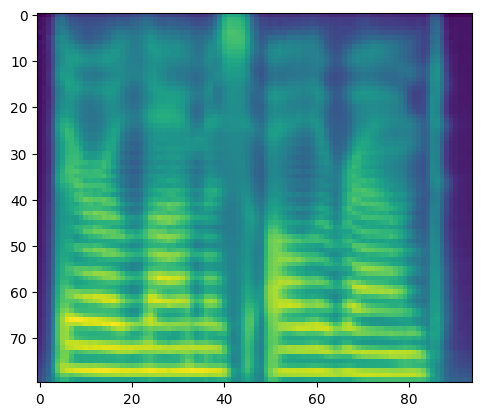

In [ ]:
plt.figure()
plt.imshow(np.rot90(np.array(spectrogram)))
plt.show()

In [ ]:
from transformers import SpeechT5HifiGan

vocoder = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan")
with torch.inference_mode():
    # あるいは
    # model.generate_speech(
    #   inputs["input_ids"],
    #   speaker_embeddings,
    #   vocoder=vocoder)
    speech = vocoder(spectrogram)

config.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/50.7M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/50.6M [00:00<?, ?B/s]

In [ ]:
import IPython.display as ipd

display(ipd.Audio(speech.numpy(), rate=16000))

In [ ]:
from transformers import VitsModel, VitsTokenizer, set_seed

tokenizer = VitsTokenizer.from_pretrained("facebook/mms-tts-eng")
model = VitsModel.from_pretrained("facebook/mms-tts-eng")

inputs = tokenizer(text="Hello - my dog is cute", return_tensors="pt")

set_seed(555)  # シード値を固定する
with torch.inference_mode():
    outputs = model(inputs["input_ids"])

outputs.waveform[0]

tokenizer_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/413 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/47.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.64k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/145M [00:00<?, ?B/s]

tensor([-3.1928e-06, -3.7791e-05, -2.9461e-05,  ...,  4.8793e-05,
         2.4377e-05, -9.9104e-06])

In [ ]:
from IPython.display import Audio

Audio(outputs.waveform[0], rate=model.config.sampling_rate)

### Barkによるスピーチ音声以外の生成


In [ ]:
from transformers import AutoModel, AutoProcessor

processor = AutoProcessor.from_pretrained("suno/bark-small")
model = AutoModel.from_pretrained("suno/bark-small").to(device)

inputs = processor(
    text=[
        """Hello, my name is Suno. And, uh — and I like pizza. [laughs]
        But I also have other interests such as playing tic tac toe."""
    ],
    return_tensors="pt",
).to(device)


speech_values = model.generate(**inputs, do_sample=True)

tokenizer_config.json:   0%|          | 0.00/353 [00:00<?, ?B/s]

speaker_embeddings_path.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.68G [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.68G [00:00<?, ?B/s]

In [ ]:
import IPython.display as ipd
display(
    ipd.Audio(
        speech_values.cpu().numpy(), rate=model.generation_config.sample_rate
    )
)

In [ ]:
voice_preset = "v2/en_speaker_6"

inputs = processor("Hello, my dog is cute", voice_preset=voice_preset)

audio_array = model.generate(**inputs.to(device))
audio_array = audio_array.cpu().numpy().squeeze()

en_speaker_6_semantic_prompt.npy:   0%|          | 0.00/2.60k [00:00<?, ?B/s]

en_speaker_6_coarse_prompt.npy:   0%|          | 0.00/7.55k [00:00<?, ?B/s]

en_speaker_6_fine_prompt.npy:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

In [ ]:
import IPython.display as ipd
display(ipd.Audio(audio_array, rate=model.generation_config.sample_rate))

### AudioGenとMusicGen


In [ ]:
from transformers import AutoProcessor, MusicgenForConditionalGeneration

model = MusicgenForConditionalGeneration.from_pretrained(
    "facebook/musicgen-small"
).to(device)
processor = AutoProcessor.from_pretrained("facebook/musicgen-small")
inputs = processor(
    text=["an intense rock guitar solo"],
    padding=True,
    return_tensors="pt",
).to(device)

audio_values = model.generate(
    **inputs, do_sample=True, guidance_scale=3, max_new_tokens=256
)

config.json:   0%|          | 0.00/7.87k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.36G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/224 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/275 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.37k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

In [ ]:
display(
    ipd.Audio(
        audio_values[0].cpu().numpy(),
        rate=model.config.audio_encoder.sampling_rate,
    )
)

In [ ]:
from transformers import pipeline

pipe = pipeline("text-to-audio", model="facebook/musicgen-small", device=device)
data = pipe("electric rock solo, very intense")

In [ ]:
display(ipd.Audio(data["audio"][0], rate=data["sampling_rate"]))

### Audio DiffusionとRiffusion


In [ ]:
from diffusers import AudioDiffusionPipeline

pipe = AudioDiffusionPipeline.from_pretrained(
    "teticio/audio-diffusion-ddim-256"
).to(device)

output = pipe()

model_index.json:   0%|          | 0.00/238 [00:00<?, ?B/s]

Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

mel_config.json:   0%|          | 0.00/191 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/276 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/847 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/455M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--teticio--audio-diffusion-ddim-256/snapshots/f5606c5138496ecdcbd096a4446eb6d03ae690cb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--teticio--audio-diffusion-ddim-256/snapshots/f5606c5138496ecdcbd096a4446eb6d03ae690cb/unet.


  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
from IPython.display import Audio

display(Audio(output.audios[0], rate=pipe.mel.get_sample_rate()))

以下のコードは、本書内の他のスペクトログラムと同じ形式に合わせて可視化している。

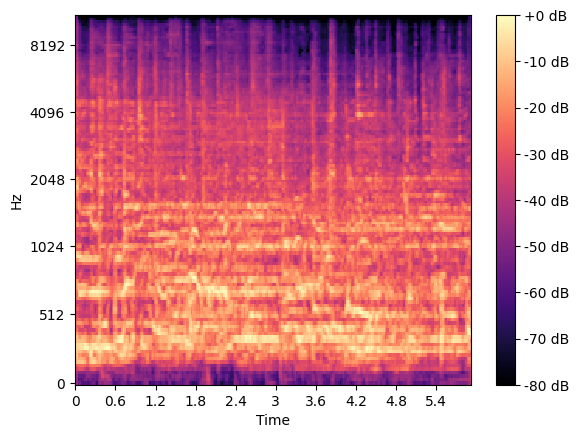

In [ ]:
S = librosa.feature.melspectrogram(
    y=output.audios[0][0], sr=pipe.mel.get_sample_rate(), n_mels=128
)
S_dB = librosa.power_to_db(S, ref=np.max)

librosa.display.specshow(
    S_dB, sr=pipe.mel.get_sample_rate(), x_axis="time", y_axis="mel"
)
plt.colorbar(format="%+2.0f dB");

In [ ]:
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained(
    "riffusion/riffusion-model-v1", torch_dtype=torch.float16
)
pipe = pipe.to(device)
prompt = "slow piano piece, classical"
negative_prompt = "drums"
spec_img = pipe(
    prompt, negative_prompt=negative_prompt, height=512, width=512
).images[0]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/284 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.84k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/unet.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/vae.
/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:276: FutureWarning: The configuration file of the unet has set the default `sample_size` to smaller than 64 which seems highly unlikely. If your checkpoint is a fine-tune

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
from IPython.display import Audio, display
from scipy.io.wavfile import read, write

from genaibook.core import wav_bytes_from_spectrogram_image

wav = wav_bytes_from_spectrogram_image(spec_img, device)
with open("output1.wav", "wb") as f:
    f.write(wav.getbuffer())

display(Audio("output1.wav"))
read("output1.wav")
sample_rate, audio = read("output1.wav")
audio = audio.astype(np.float16)

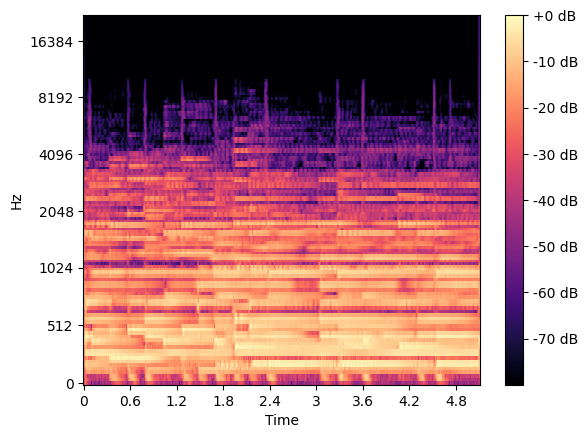

In [ ]:
S = librosa.feature.melspectrogram(y=audio, sr=sample_rate)
S_dB = librosa.power_to_db(S, ref=np.max)

librosa.display.specshow(S_dB, sr=sample_rate, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB");

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "riffusion/riffusion-model-v1", torch_dtype=torch.float16
)
pipe = pipe.to(device)

prompt = "guitar, acoustic, calmed"
generator = torch.Generator(device=device).manual_seed(1024)
image = pipe(
    prompt=prompt,
    image=spec_img,
    strength=0.7,
    guidance_scale=8,
    generator=generator,
).images[0]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/unet.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/vae.
/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:292: FutureWarning: The configuration file of the unet has set the default `sample_size` to smaller than 64 which seems highly unlikely. If your checkpoint is a f

  0%|          | 0/35 [00:00<?, ?it/s]

In [ ]:
from IPython.display import Audio, display


wav = wav_bytes_from_spectrogram_image(image)
with open("output1.wav", "wb") as f:
    f.write(wav.getbuffer())

display(Audio("output1.wav"))
read("output1.wav")
sample_rate, audio = read("output1.wav")
audio = audio.astype(np.float16)

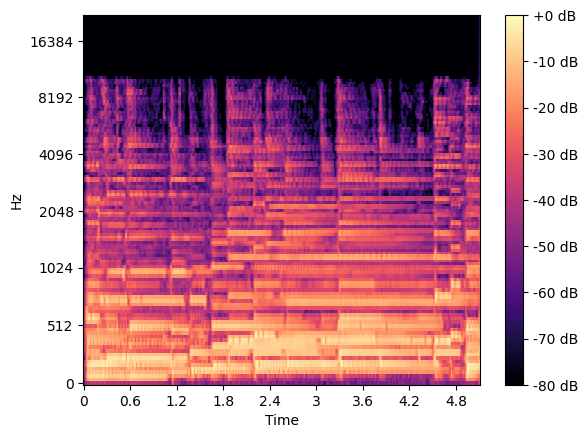

In [ ]:
S = librosa.feature.melspectrogram(y=audio, sr=sample_rate)
S_dB = librosa.power_to_db(S, ref=np.max)

librosa.display.specshow(S_dB, sr=sample_rate, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB");

### Dance Diffusion


In [ ]:
from diffusers import DanceDiffusionPipeline

pipe = DanceDiffusionPipeline.from_pretrained(
    "harmonai/maestro-150k", torch_dtype=torch.float16
)
pipe = pipe.to(device)
audio = pipe(audio_length_in_s=5, num_inference_steps=50).audios[0]

model_index.json:   0%|          | 0.00/196 [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/106 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.06k [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/886M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--harmonai--maestro-150k/snapshots/fd9b508aa66fb717fe59993eb0c7f33923f05f87/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--harmonai--maestro-150k/snapshots/fd9b508aa66fb717fe59993eb0c7f33923f05f87/unet.


  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
write("maestro_test.wav", pipe.unet.config.sample_rate, audio.transpose())
read("maestro_test.wav")

(16000,
 array([[-5.0849915e-03, -1.2336731e-02],
        [-2.7713776e-03, -8.1024170e-03],
        [-5.7373047e-03, -7.7857971e-03],
        ...,
        [-1.5068054e-03, -2.1247864e-03],
        [-3.5047531e-05, -1.6403198e-03],
        [ 1.4781952e-03, -2.0980835e-03]], dtype=float32))

In [ ]:
import IPython.display as ipd

display(ipd.Audio(audio, rate=pipe.unet.config.sample_rate))

## 課題


**1. 波形とスペクトログラムそれぞれの長所と短所は。**

**波形**

* 長所
    * 波形は生の音声信号そのものであり、音の再現に必要なすべての情報を保持している。
    * 波形は変換や損失なしに、すべての時間領域情報を含んでいる。
* 短所
    * 波形から周波数情報を読み取ることが困難。
    * 波形は数百万サンプルにも及ぶことがあり、その高次元性ゆえにモデルで扱うことが困難になる。次元を削減すると、波形中の周波数情報に大きく影響し、モデルの性能に悪影響を及ぼす場合がある。
    * モデルが波形から有用な特徴を直接学習することが難しい。

**スペクトログラム**
* 長所
    * スペクトログラムは、信号中の周波数スペクトルが時間とともにどう変化するかをコンパクトかつ視覚的に表現でき、解釈しやすい。
    * 時間情報と周波数情報の両方を捉えられるため、音声処理タスクで扱いやすい。
* 短所
    * スペクトログラムは損失のある不可逆表現であり、生波形にあった情報の一部が失われる場合がある。

**2. スペクトログラムとは何か。メルスペクトログラムとは何か。モデルで利用されるのはどちらか。**

スペクトログラムは、信号の周波数と振幅が時間とともにどのように変化するかをプロットしたものであり、時間、周波数、振幅を1枚の図で可視化できる。x軸が時間、y軸が周波数、色が各周波数成分の強度（振幅）を示す。

メルスペクトログラムは、スペクトログラム上の周波数を人間の聴覚に近いスケールに変換したものである。メルスペクトログラムでは、周波数軸上の間隔が知覚上の感覚と等しくなるよう設計されている。

どちらのスペクトログラムもモデルで使われるが、メルスペクトログラムは人間の聴覚特性により近いため、さまざまなケースで用いられることが多い。

**3. CTCの仕組みを説明せよ。エンコーダーベースのASRモデルでCTCが必要とされるのはなぜか。**

CTC（Connectionist Temporal Classification）は、入力シーケンス（音声フレーム）と出力シーケンス（テキスト文字起こし）を明示的なアライメントなしで整合させる技術である。これは、スピーチの音素ごとの長さが固定長の音声フレームと必ずしも一致しないため、非常に重要である。たとえばWav2Vec2のようなモデルでは、各音声フレームが、25msなどの短い区間に対応する埋め込みとして表現される場合がある。もし25msごとに1文字を予測する設計だと、出力が非常に冗長になってしまうだろう。たとえば1秒の音声から40文字近く生成され、次のような出力になる可能性がある。


```
CHAAAAAPTTERRRSSIXTEEEEENIMMMIIGHT...
```

これは無理もないことで、文字が複数の音声フレームにわたって引き伸ばされることがあるからだ。CTCは音声フレームと文字列を整合させるために用いられる。CTCはモデルに2つの特別なトークン、つまり文字を分けるパディングトークンと、単語を区切るセパレータートークンを予測させる仕組みを導入する。モデルはこれらのトークンを予測することを学び、次の例のように出力されるだろう。


```
CHAAAAA*PTT*ERRR/SS*IX*T*EE*EEN/I/MMM*II*GHT
```

グループ内の重複する文字は、簡単にまとめることができる。

**4. もし推論時のデータのサンプリングレートが8kHzで、モデルの訓練時のサンプリングレートが16kHzだった場合、何が起きるか。**

モデルとデータの間でサンプリングレートが一致しないと、モデルは正しくデータを処理できない。その結果、性能が大きく低下したり、文字起こしの結果に誤りが生じたり、最悪の場合モデルが動作しなくなる可能性がある。推論時には、必ずモデルが訓練時に使ったサンプリングレートに合わせてデータをリサンプリングする必要がある。

**5. エンコーダーベースのモデルにn-gramモデルを追加する方法は。**

音響モデルはあくまで音に基づいており、言語情報は組み込まれていない。このため、誤字、存在しない単語の出力、似た単語の混同などが起きやすい。これを緩和する方法として言語モデルを用いることがある。n-gramモデルはシンプルな言語モデルであり、エンコーダーベースモデルの出力の補正に利用できる。n-gramモデルは計算コストが低く、Wav2Vec2のようなエンコーダーベースASRモデルの性能を大きく向上させることができる。

n-gramモデルのスコアは、生成段階で統合される。たとえば、モデルの確率とn-gramモデルの確率を重み付き和で組み合わせることで、最終的な出力が決まる。n-gramモデルは、エンコーダーベースのモデルによって生じた誤りの修正に役立つ。

**6.  ASRにおける、エンコーダーベースのモデルとエンコーダー・デコーダーベースのモデルそれぞれの長所と短所は。**

**エンコーダーベースのモデル**

長所:
* **計算効率の高さ:** 一般的に計算効率が優れており、自己回帰処理を必要としないため、訓練と推論いずれも高速に行える。
* **アーキテクチャーがシンプル:** エンコーダー・デコーダー型と比べて実装や訓練が容易である。
* **対応関係が明確:** 入力シーケンスと出力シーケンス間に明確な1対1の対応関係があり、アライメント処理が単純で済む。CTC処理は必要だが、予期しないトークンが増えることはない。

短所:
* **コンテキストの限界:** エンコーダベースモデルは、多くの場合、長距離依存性や長いシーケンスにわたるコンテキストの維持が苦手であるため、複雑なASRタスクでのパフォーマンスに影響を及ぼす可能性がある。


**エンコーダー・デコーダーベースのモデル**

長所:
* **言語モデルが内包:** デコーダーが言語モデルの役割を兼ねるため、外部のn-gram言語モデルが不要となり、システム全体が簡素化される。
* **出力の品質:** 長距離依存性やコンテキストをより適切に処理できるため、特に複雑なASRタスクにおいて、高品質な出力が得られやすい。

短所:
* **ハルシネーション（幻覚）のリスク:** 入力に対応しないトークンを生成する「ハルシネーション（幻覚）」が発生しやすい。
* **推論速度が遅い:** 自己回帰的にトークンをひとつずつ生成するため、生成が遅くなる。これはリアルタイム用途ではボトルネックとなることがある。

**7.ASRの評価を行う際に、WERではなくCERを使用したほうがよいケースは。**

WER（Word Error Rate）はASRシステムの評価によく用いられるが、これはシステムに高い理解力を求めるためである。一方で、日本語のように単語という概念が明確でない言語では、CER（Character Error Rate）を用いることが多い。また、細かい粒度で精度を評価したい場合や、エラーの詳細を理解したい場合にもCERが適している。


**8. SpeechT5で使われる6つのネットは何か。音声変換を行うにはどのような構成が必要か。**

SpeechT5では、テキストまたは音声のエンコーダープリネット（2つ）、デコーダープリネット（2つ）、デコーダーポストネット（2つ）の合計6つのネットワークを用いる。音声変換を行う場合は、音声エンコーダープリネット、音声デコーダープリネット、音声デコーダーポストネットを使用した構成となる。


**9. ボコーダーとは何か。どのような場合にボコーダーが用いられるか。**

音声機械学習では、ボコーダーはメルスペクトログラムなどの表現を音声波形に変換する用途で用いられる。TTA（Text-to-Audio）システムでは、出力がスペクトログラムとなることが一般的だが、スペクトログラムには全ての情報（位相情報など）が含まれていないため、ボコーダーで波形へ変換する必要がある。

**10. EnCodecモデルの目的は何か。**

EnCodecは、リアルタイムで音声を圧縮することができるニューラルコーデックである。音声を量子化された潜在空間上のコードブック（ベクトル）に圧縮する仕組みで、高い圧縮率を実現しながら音質を保つことができる。

**11. TTAモデルがMuLanやCLAPを活用し、ラベル付きデータへの依存を軽減する仕組みを説明せよ。**

TTAモデルは、CLIPと同様にテキストと音声を同じ埋め込み空間にマッピングできる。モデルの訓練時には、CLAPを使って音声サンプルの埋め込みを生成し、その埋め込みを条件付けとしてモデルに入力する。推論時には、代わりにテキストの埋め込みを利用する。

### 演習

**12. Whisperの調査： 以下のコードスニペットは、ランダムな配列とWhisper特徴抽出器をゼロから作成したものだ。`feature_size`、`hop_length`、`chunk_length`を変更したときに、入力特徴の形状がどう変化するかを確認しよう。次に、`WhisperFeatureExtractor`の[ドキュメント](https://huggingface.co/docs/transformers/en/model_doc/whisper)に記載されているデフォルト値とそれぞれの意味を調べ、音声チャンクに対してどのような特徴が生成されるかを確認しよう。**

In [ ]:
import numpy as np
from transformers import WhisperFeatureExtractor

array = np.zeros((16000, ))
feature_extractor = WhisperFeatureExtractor(feature_size=100)
features = feature_extractor(
    array, sampling_rate=16000, return_tensors="pt"
)
features["input_features"].shape

torch.Size([1, 100, 3000])

* 1: バッチサイズ
* 100: 音声チャンクから抽出される特徴ベクトルの数
* 3000: 特徴ベクトルの次元数。時間間隔ごとの特徴の数を示す。

これらの数値について考察する。サンプリングレートは16000 Hzで、`chunk_length`はデフォルト値の30である。このパラメーターは、音声処理時に使用されるサンプルの最大チャンク数を指定する。この場合、音声は30単位のチャンクに分割される。音声チャンクごとに抽出される特徴ベクトルの数を計算するには、連続するチャンク間の重なり（overlap）を考慮する必要がある。この重なりは`hop_length`パラメータによって決まる。`hop_length`は特徴抽出間のサンプル数を定義する。`hop_length`が小さいほど特徴抽出の頻度が増え、より詳細な情報を捉えることができるが、同時に特徴量や計算コストも増大する。

1チャンクあたりの総サンプル数 = `chunk_length` * `sampling_rate` = 30 * 16000 = 480000 サンプル

1チャンクあたりの特徴ベクトル数 = 1チャンクあたりの総サンプル数 / `hop_length` = 480000 / 160 = 3000

つまり、バッチ内に1つの音声サンプルがあり、各サンプルは3000のタイムステップと、各タイムステップごとに100次元の特徴を持つ形になる。

`feature_size`を増やすと、各タイムステップごとに抽出される特徴ベクトルの次元が増える。これにより、より多くの情報を捉えることができるが、必要な計算リソースも多くなる。

In [ ]:
feature_extractor = WhisperFeatureExtractor(feature_size=200)
features = feature_extractor(
    array, sampling_rate=16000, return_tensors="pt"
)
features["input_features"].shape

torch.Size([1, 200, 3000])

`hop_length`を半分にすると、モデルに入力される特徴数は2倍になる。`hop_length`はスペクトログラムにおけるオーバーラップするウィンドウの長さである。これを小さくすることで、ウィンドウ数、つまり特徴数が増加する。



In [ ]:
feature_extractor = WhisperFeatureExtractor(feature_size=100, hop_length=80)
features = feature_extractor(
    array, sampling_rate=16000, return_tensors="pt"
)
features["input_features"].shape

torch.Size([1, 100, 6000])

同様に、`chunk_length`を2倍にすると、モデルに入力される特徴数も2倍になる。`chunk_length`は処理する音声チャンクの長さを示しており、これを倍にすることで、各チャンクから抽出される特徴数も倍増する。

In [ ]:
feature_extractor = WhisperFeatureExtractor(feature_size=100, chunk_length=60)
features = feature_extractor(
    array, sampling_rate=16000, return_tensors="pt"
)
features["input_features"].shape

torch.Size([1, 100, 6000])

**13. 音声変換： SpeechT5を用いて、入力音声を別の話者の声で話す音声変換を実装しよう。**

このコードは本書中のTTSのコードと非常に似ているが、以下のような違いがある。

* 使用する事前訓練済みモデルが異なる（`microsoft/speecht5_vc` を使用する）。
* モデルとして `SpeechT5ForSpeechToSpeech` クラスを用いる。
* 入力がテキストではなく音声となる。

In [ ]:
# サンプルを読み込む
from datasets import load_dataset

ds = load_dataset(
    "librispeech_asr",
    split="train.clean.100",
    streaming=True,
    trust_remote_code=True,
)
sample = next(iter(ds))
array = sample["audio"]["array"]

In [ ]:
from transformers import SpeechT5ForSpeechToSpeech
import torch

processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_vc")
# 主な違い1: 別のモデルクラスを使用する
model = SpeechT5ForSpeechToSpeech.from_pretrained("microsoft/speecht5_vc")

# 主な違い2: 音声配列を入力とする
inputs = processor(
    audio=array, sampling_rate=16000, return_tensors="pt"
)

embeddings_dataset = load_dataset(
    "Matthijs/cmu-arctic-xvectors", split="validation"
)
speaker_embeddings = torch.tensor(
    embeddings_dataset[7440]["xvector"]
).unsqueeze(0)

with torch.no_grad():
    # 主な違い3: input_ids ではなく input_values を使用する
    spectrogram = model.generate_speech(inputs["input_values"], speaker_embeddings)

Some weights of the model checkpoint at microsoft/speecht5_vc were not used when initializing SpeechT5ForSpeechToSpeech: ['speecht5.encoder.prenet.pos_conv_embed.conv.weight_g', 'speecht5.encoder.prenet.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing SpeechT5ForSpeechToSpeech from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing SpeechT5ForSpeechToSpeech from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of SpeechT5ForSpeechToSpeech were not initialized from the model checkpoint at microsoft/speecht5_vc and are newly initialized: ['speecht5.encoder.prenet.pos_conv_embed.conv.parametrizations.weight.original0', 'speecht5.encoder.prenet.pos_conv_embed.conv.parametrizati

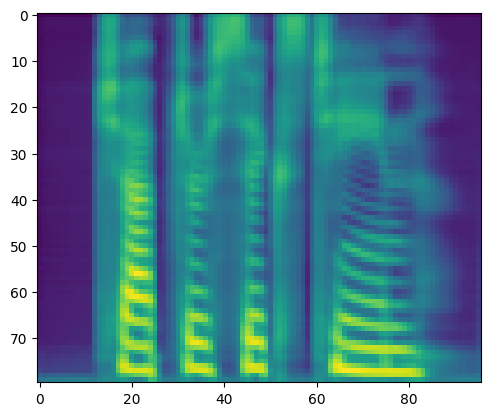

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

plt.figure()
plt.imshow(np.rot90(np.array(spectrogram)))
plt.show()

ここでもボコーダーを使おう。

In [ ]:
from transformers import SpeechT5HifiGan

vocoder = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan")
with torch.no_grad():
    speech = vocoder(spectrogram)

In [ ]:
len(speech)

24576

In [ ]:
import IPython.display as ipd

display(ipd.Audio(speech.numpy(), rate=16000))

うまく動作しているように見える。しかし、なぜか出力が途中で切れており、最初の2語だけが変換されている。これを調査すると、ボコーダーの「threshold」というパラメーターによって音声の終わりを予測して処理を終了してしまうことがわかった。本件の詳細については[SpeechT5のドキュメント](https://huggingface.co/docs/transformers/en/model_doc/speecht5)を参照してほしい。